**Atenção: Devido a natureza dos dados, para correto funcionamento, este notebook precisa ser executado em ambiente com memória RAM maior ou igual a 25 Gb.**

#**Ciência e Visualização de Dados**
##**Projeto Final - Entrega 02**
###Alunos: 
###Gleyson Roberto do Nascimento. RA: 043801. Elétrica.
###Negli René Gallardo Alvarado. RA: 234066. Saúde.
###Rafael Vinícius da Silveira. RA: 137382. Física.
###Sérgio Sevileanu. RA: 941095. Elétrica.



##Neste notebook do Google Colaboratory será realzada a análise estatística do Estado do Paraná durante os anos de 2008 a 2018 segundo o banco de dados [SIHSUS](https://bigdata-metadados.icict.fiocruz.br/dataset/sistema-de-informacoes-hospitalares-do-sus-sihsus/resource/ae85ac54-6734-43b8-a820-6129a854e1ff).

##Desta forma, algumas definições iniciais e um disclaimer se fazem necessários para este projeto:

##Será definido como **diagnóstico correto** aquele em que houve apenas um diagnóstico de CID10, sem alterações durante o período até a alta;  
##Será definido como **diagnóstico equivocado** aquele em que houve mais de um diagnóstico de CID10, contudo, eles fazem parte do mesmo grupo, de forma que é plausível o equívoco dada a semelhança de sintomas entre os CID10;
##Será definido como **falha de diagnóstico** aquele em que houve mais de um diagnóstico de CID10, contudo, eles fazem parte de grupos distintos, de forma que embora possam existir sintomas semelhantes entre os CID10, caberia ao profissional uma análise mais aprofundada antes do diagnóstico.
##**Disclaimer**: Considerando a natureza do banco de dados do SIHSUS, isto é, um Big Data em que inúmeros funcionários do Sistema Único de Saúde possuem acesso e inserem os dados de forma manual em realdades e condições bastante distintas, existe a séria possibildade de erro sistemático, desta forma, a acurácia deste trabalho deve ser considerada com ressalvas.

##Instalando e Importando as Bibliotecas Necessárias.

In [ ]:
!pip install dask[complete]
!pip install -U -q PyDrive

In [ ]:
%load_ext google.colab.data_table
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pickle
import dask
from dask import dataframe as dd
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from google.colab import files
from oauth2client.client import GoogleCredentials
pd.set_option('display.max_columns', None)
pd.options.display.precision = 2
pd.options.display.max_rows = 50
import seaborn as sns
import missingno as msno
import matplotlib as mpl
from matplotlib import rcParams
mpl.rc('figure', max_open_warning = 0)
import statsmodels.api as sm
from statsmodels.api import graphics
import statsmodels.formula.api as smf
import statsmodels.stats.multicomp as multi
from scipy.stats import pearsonr
from scipy.stats import spearmanr
pd.set_option('display.max_columns', None)
import itertools
import sklearn
from sklearn.metrics import mean_squared_error
from sklearn.metrics import classification_report
from sklearn import preprocessing
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings("ignore")

##Fazendo Autenticação do Gooogle Drive, Baixando os Arquivos e Criando Dataframes.

##O dicionário de Variáveis para os arquivos se econtra no [GitHub](https://github.com/grnbatera/Data4health/blob/main/assets/Dicion%C3%A1rio%20de%20Vari%C3%A1veis.csv) 



In [ ]:
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

In [ ]:
ids = ['1Hdzz218LvSzz_reDjndKZ2a6r_M_zKl-','1LcqDxhUAIwVEsMEcrfAAQGjoQvCD8qGn','19zx0YYD10ddYYGGk5BOwKcvLSlyE0DcQ','1vffaXC_qag8_dwf49xDPL7CctAxZ6_x-','16g9O_wwsowh5V6CHNRWxnpA1rQtxZX7G']
estados = ['SP','BA','PR','PA','GO']
arquivo = ['sp.pkl','ba.pkl','pr.pkl','pa.pkl','go.pkl']

In [ ]:
dflist=[]
for i in range (len(ids)):
  fileDownloaded = drive.CreateFile({'id':ids[i]})
  fileDownloaded.GetContentFile(arquivo[i])
  globals()[estados[i]] = pd.read_pickle(arquivo[i])
  globals()[estados[i]] = (globals()[estados[i]]).reset_index(drop=True)
  dflist.append(eval(estados[i]))

###Baixando arquivo com Valores Anuais de Custo por Internação e Atendimento e fazendo o merge com o arquivo principal do SIHSUS.

In [ ]:
fileDownloaded = drive.CreateFile({'id':'1corB_xGrJ3NDFpIXuKDl6Dri_tlPLzI0'})
fileDownloaded.GetContentFile('anual.xlsx')
anual = pd.read_excel('anual.xlsx',sheet_name='anual')

In [ ]:
anual['cep'] = [i[0] for i in anual.v241.str.split(' ').values]

In [ ]:
anual['cep']=anual['cep'].astype('int64')
anual.columns = ['v1',	'v241',	'v242',	'v243',	'v244',	'v245',	'v246',	'v247',	'v248',	'v249',	'v250',	'v251',	'v252','v0']

In [ ]:
full = pd.merge(PR,anual, on=['v0','v1'],how='left')

In [ ]:
full

,v0,v1,v2,v3,v4,v5,v6,v7,v8,v9,v10,v11,v12,v13,v14,v15,v19,v20,v21,v22,v23,v27,v28,v29,v30,v31,v32,v33,v43,v44,v45,v46,v47,v48,v49,v50,v51,v52,v54,v55,v56,v57,v59,v60,v61,v62,v63,v64,v65,v66,v67,v68,v69,v70,v72,v73,v76,v77,v78,v79,v80,v82,v83,v85,v87,v88,v89,v90,v91,v92,v93,v94,v96,v97,v98,v100,v101,v104,v105,v106,v107,v108,v109,v112,v113,v114,v115,v116,v117,v118,v121,v122,v123,v124,v125,v126,v127,v128,v137,v138,v139,v141,v143,v145,v147,v149,v151,v153,v155,v156,v157,v158,v159,v160,v161,v162,v163,v164,v165,v166,v167,v168,v169,v170,v171,v172,v173,v174,v175,v176,v177,v178,v179,v180,v181,v182,v183,v184,v185,v186,v187,v188,v189,v192,v193,v194,v195,v196,v197,v198,v199,v200,v201,v202,v203,v204,v205,v206,v207,v208,v209,v210,v211,v212,v213,v215,v216,v218,v219,v220,v221,v222,v223,v224,v225,v226,v227,v228,v229,v230,v231,v232,v234,v235,v237,v238,v239,v241,v242,v243,v244,v245,v246,v247,v248,v249,v250,v251,v252
0,410000,2008,12,3,NaN,4108107722290,APAC CNRAC,4108107722290,1,Normal,86610000,411190,41,19421204,3,Feminino,0,0,0,0,Não utilizou UTI,0,3,3,305020013,305020013,200.56,27.94,228.50,0.0,98.91,20080930,20081003,N111,NaN,12,Alta melhorado,50,NaN,NaN,2,Estadual plena,0,Não,411190,41,4,Anos,65,3,3,0,Sem óbito,10,1,1,0,Não,0,Sem filhos/Não inform,0,NaN,0,0,1,Sim,0,0,Seqüencial zerado,0,0,0,NaN,0,0,2729407,7.55e+13,NaN,NaN,2,Média complexidade,6,Média e Alta Complexidade (MAC),7102,S/crédito na média complex hospitalar (exc FAEC),99,NaN,NaN,22,HE41000001N200812.DTS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,411190,Jaguapitã,JAGUAPITA,N,N,N,41,4190,4117,41900,-23.11,-51.53,610.0,475.00,411190,411190,Jaguapitã,JAGUAPITA,N,N,N,41,4190,4117,41900,-23.11,-51.53,610,475.00,411190,PR,41,PARANA,PR,PARANA,Região Sul,Região Sul,Paraná,PR,Paraná,PR,Jaguapitã,Jaguapitã,NaN,NaN,17ª RS Londrina,17ª RS Londrina,NaN,NaN,N.Central PR,N.Central PR,Astorga,Londrina,Londrina,Região não definida - PR,Região não definida - PR,NaN,Brasil,Não Informado,Clínico,TRATAMENTO DA PIELONEFRITE,TRATAMENTO DA PIELONEFRITE,65,50e+a,65e+a,65-69a,Capítulo XIV - Doenças do aparelho geniturinário,Doenças renais túbulo-intersticiais,Nefrite túbulo-intersticial crônica,Pielonefrite obstrutiva crônica,NaN,NaN,NaN,NaN,2008,ter,2008,sex,65,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,410000,2008,12,7,NaN,4108107731035,APAC CNRAC,4108107731035,1,Normal,86140000,412050,41,20080529,3,Feminino,0,0,0,0,Não utilizou UTI,0,0,3,303140151,303140151,504.07,78.35,582.42,0.0,252.12,20081112,20081115,J189,NaN,12,Alta melhorado,50,NaN,NaN,2,Estadual plena,0,Não,412050,41,3,Meses,5,3,3,0,Sem óbito,10,2,2,0,Não,0,Sem filhos/Não inform,0,NaN,0,0,1,Sim,0,0,Seqüencial zerado,0,0,0,NaN,1,10980342791,2729431,8.65e+12,NaN,NaN,2,Média complexidade,6,Média e Alta Complexidade (MAC),7102,S/crédito na média complex hospitalar (exc FAEC),1,Branca,NaN,175,HE41000001N200812.DTS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,412050,Primeiro de Maio,PRIMEIRO DE MAIO,N,N,N,41,4190,4117,41900,-22.85,-51.03,330.0,414.44,412050,412050,Primeiro de Maio,PRIMEIRO DE MAIO,N,N,N,41,4190,4117,41900,-22.85,-51.03,330,414.44,412050,PR,41,PARANA,PR,PARANA,Região Sul,Região Sul,Paraná,PR,Paraná,PR,Primeiro de Maio,Primeiro de Maio,Londrina - PR,Londrina - PR,17ª RS Londrina,17ª RS Londrina,NaN,NaN,N.Central PR,N.Central PR,Porecatu,Londrina,Londrina,Região não definida - PR,Região não definida - PR,NaN,Brasil,Não Informado,Pediátricos,TRATAMENTO DE PNEUMONIAS OU INFLUENZA (GRIPE),TRATAMENTO DE PNEUMONIAS OU INFLUENZA (GRIPE),0,<1a,<1a,<1a,Capítulo X - Doenças do aparelho respiratório,Influenza [gripe] e pneumonia,Pneumonia por microorganismo não especificada,Pneumonia não especificada,NaN,NaN,NaN,NaN,2008,qua,2008,sab,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,410000,2008,12,7,NaN,4108107731057,APAC CNRAC,4108107731057,1,Normal,86140000,412050,41,20071217,1,Masculino,0,0,0,0,Não utilizou UTI,0,0,4,303140151,303140151,504.07,78.35,582.42,0.0,252.12,20081113,200

###Fazendo o download do arquivo intermediário 1 em pickle para evitar retrabalho caso o Colab dê problema de RAM. 

In [ ]:
with open('full.pkl','wb') as f:
  pickle.dump(full,f,pickle.HIGHEST_PROTOCOL)

In [ ]:
from google.colab import files
files.download('full.pkl')

##Fazendo o tratamento do banco.

###Fazendo uma análise das variáveis para verificar se são numéricas ou categóricas, verificar o tipo e a quantidade de itens únicos por variável.

In [ ]:
draw={}
categoricon = []
categoricost = []
notcategorical = []
k=2
print('\033[1m'+'Valores únicos de '+ estados[k]+'\033[0m')
for col in full:
  draw[col] = full[col].unique()
  print('Variavel: ',col,' | Tipo da Variável: ',full[col].dtypes,' | Quantidade de itens: ',len(draw[col]))
  if full[col].dtypes != 'object' and len(draw[col]) < 5000:
    categoricon.append(col)
  elif full[col].dtypes != 'object' and len(draw[col]) > 5000:
    notcategorical.append(col)
  else:
    categoricost.append(col)    
print('\n')

Valores únicos de PR
Variavel:  v0  | Tipo da Variável:  int64  | Quantidade de itens:  38
Variavel:  v1  | Tipo da Variável:  int64  | Quantidade de itens:  11
Variavel:  v2  | Tipo da Variável:  int64  | Quantidade de itens:  1
Variavel:  v3  | Tipo da Variável:  int64  | Quantidade de itens:  13
Variavel:  v4  | Tipo da Variável:  float64  | Quantidade de itens:  383
Variavel:  v5  | Tipo da Variável:  int64  | Quantidade de itens:  711691
Variavel:  v6  | Tipo da Variável:  object  | Quantidade de itens:  2
Variavel:  v7  | Tipo da Variável:  int64  | Quantidade de itens:  711691
Variavel:  v8  | Tipo da Variável:  int64  | Quantidade de itens:  2
Variavel:  v9  | Tipo da Variável:  object  | Quantidade de itens:  2
Variavel:  v10  | Tipo da Variável:  int64  | Quantidade de itens:  40500
Variavel:  v11  | Tipo da Variável:  int64  | Quantidade de itens:  1267
Variavel:  v12  | Tipo da Variável:  int64  | Quantidade de itens:  27
Variavel:  v13  | Tipo da Variável:  int64  | Quanti

###Substituindo valores de Missing para tratamento de categorias.

In [ ]:
full[categoricon] = (full[categoricon]).fillna(99999)
full[categoricost] = (full[categoricost]).fillna('a99999')
full[notcategorical] = (full[notcategorical]).fillna('a99999')
full[['v248','v250','v251','v252']]=full[['v248','v250','v251','v252']].replace('a99999',9.99999)
full[['v243','v249']]=full[['v243','v249']].replace('a99999',99999)

In [ ]:
full2=full.copy()

###Criando categorias numéricas para as variáveis do tipo string.

In [ ]:
for i in range(len(categoricost)):
  le = preprocessing.LabelEncoder()
  le.fit(full2[categoricost[i]])
  full2[categoricost[i]]=le.transform(full2[categoricost[i]])
  print('As categorias de', categoricost[i] , 'eram:' , le.classes_ , 'e mudaram para:' , sorted(full2[categoricost[i]].unique()))

As categorias de v6 eram: ['9' 'APAC CNRAC'] e mudaram para: [0, 1]
As categorias de v9 eram: ['Longa permanência' 'Normal'] e mudaram para: [0, 1]
As categorias de v15 eram: ['Feminino' 'Masculino'] e mudaram para: [0, 1]
As categorias de v23 eram: ['Não utilizou UTI' 'UTI Doador' 'UTI adulto - tipo I'
 'UTI adulto - tipo II' 'UTI adulto - tipo III'
 'UTI coronariana tipo II - UCO tipo II' 'UTI de queimados'
 'UTI infantil - tipo I' 'UTI infantil - tipo II'
 'UTI infantil - tipo III' 'UTI neonatal - tipo I'
 'UTI neonatal - tipo II' 'UTI neonatal - tipo III'
 'Utilizou mais de um tipo de UTI'] e mudaram para: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13]
As categorias de v48 eram: ['A000' 'A001' 'A009' ... 'Z982' 'Z988' 'Z992'] e mudaram para: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 6

###Criando categorias numéricas para as variáveis do tipo numérico.

In [ ]:
for i in range(len(categoricon)):
  le = preprocessing.LabelEncoder()
  le.fit(full2[categoricon[i]])
  full2[categoricon[i]]=le.transform(full2[categoricon[i]])
  print('As categorias de', categoricon[i] , 'eram:' , le.classes_ , 'e mudaram para:' , sorted(full2[categoricon[i]].unique()))

As categorias de v0 eram: [410000 410045 410050 410140 410180 410260 410430 410540 410550 410590
 410650 410660 410690 410720 410830 410832 410840 410860 410880 411060
 411080 411220 411370 411420 411440 411520 411540 411760 411850 411890
 411910 412380 412535 412550 412720 412760 412800 412810] e mudaram para: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37]
As categorias de v1 eram: [2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018] e mudaram para: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
As categorias de v2 eram: [12] e mudaram para: [0]
As categorias de v3 eram: [ 1  2  3  4  5  6  7  8  9 10 12 14 87] e mudaram para: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
As categorias de v4 eram: [9.9999000e+04 1.1136500e+11 1.1170900e+11 3.0414800e+11 6.9430300e+11
 9.4202000e+11 9.4206300e+11 1.0719940e+12 1.0877390e+12 1.4184530e+12
 1.7883620e+12 2.1947830e+12 2.2016950e+12 2.3514080e+12 2.438461

###Criando categorias numéricas para as variáveis com grande número de valores únicos.

In [ ]:
for i in range(len(notcategorical)):
  le = preprocessing.LabelEncoder()
  le.fit(full2[notcategorical[i]])
  full2[notcategorical[i]]=le.transform(full2[notcategorical[i]])
  print('As categorias de', notcategorical[i] , 'eram:' , le.classes_ , 'e mudaram para:' , sorted(full2[notcategorical[i]].unique()))

###Salvando este arquivo como final.

In [ ]:
with open('full2.pkl','wb') as f:
  pickle.dump(full2,f,pickle.HIGHEST_PROTOCOL)

In [ ]:
files.download('full2.pkl')

###Fazendo a análise estatística para o arquivo final.

In [ ]:
full2.describe()

,v0,v1,v2,v3,v4,v5,v6,v7,v8,v9,v10,v11,v12,v13,v14,v15,v19,v20,v21,v22,v23,v27,v28,v29,v30,v31,v32,v33,v43,v44,v45,v46,v47,v48,v49,v50,v51,v52,v54,v55,v56,v57,v59,v60,v61,v62,v63,v64,v65,v66,v67,v68,v69,v70,v72,v73,v76,v77,v78,v79,v80,v82,v83,v85,v87,v88,v89,v90,v91,v92,v93,v94,v96,v97,v98,v100,v101,v104,v105,v106,v107,v108,v109,v112,v113,v114,v115,v116,v117,v118,v121,v122,v123,v124,v125,v126,v127,v128,v137,v138,v139,v141,v143,v145,v147,v149,v151,v153,v155,v156,v157,v158,v159,v160,v161,v162,v163,v164,v165,v166,v167,v168,v169,v170,v171,v172,v173,v174,v175,v176,v177,v178,v179,v180,v181,v182,v183,v184,v185,v186,v187,v188,v189,v192,v193,v194,v195,v196,v197,v198,v199,v200,v201,v202,v203,v204,v205,v206,v207,v208,v209,v210,v211,v212,v213,v215,v216,v218,v219,v220,v221,v222,v223,v224,v225,v226,v227,v228,v229,v230,v231,v232,v234,v235,v237,v238,v239,v241,v242,v243,v244,v245,v246,v247,v248,v249,v250,v251,v252
count,713175.00,713175.00,713175.0,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.0,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.0,713175.0,7.13e+05,7.13e+05,7.13e+05,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,7.13e+05,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.0,713175.00,713175.00,713175.0,713175.0,713175.00,713175.0,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.0,713175.00,713175.0,713175.0,713175.0,713175.00,713175.0,713175.0,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.0,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00,713175.00
mean,7.34,5.09,0.0,1.64,155.48,355747.96,1.00,355747.96,0.03,0.97,22750.66,612.10,20.00,20365.42,0.55,0.45,0.50,0.50,0.50,0.36,0.37,0.02,1.12,4.28,502.94,500.81,31744.68,6045.15,35777.21,14.65,28954.61,1336.48,1024.75,2788.40,1041.83,4.83,8.12,2.97,18.15,12.92,0.56,0.44,0.11,0.11,112.27,0.0,1.94,1.06,41.67,4.73,4.73,0.04,0.96,0.04,0.83,0.83,0.07,0.93,0.02,12.96,0.02,18.99,0.05,0.03,1.00,1.00,1232.97,0.0,0.0,8.72e-04,4.48e-03,3.27e-04,10.62,0.18,16.11,174.43,45.21,352.85,860.00,1.10,0.90,0.96,0.96,0.46,2.90,1.33,2.13,3.04,14717.33,67.50,20.72,25.40,11.90,12.18,71.85,1.80,1.80,1444.15,1.93,1.93,1.86,1.86,1.86,1.86,1.24,1.24,0.62,0.62,612.10,556.24,562.58,7.17e-04,0.23,0.14,20.00,43.01,158.12,84.95,464.11,531.66,428.84,705.98,612.10,112.27,111.44,112.27,0.0,0.22,0.19,0.0,0.0,7.67,0.0,112.31,177.25,130.35,194.88,112.27,17.02,0.0,15.03,0.0,0.0,0.0,3.99,0.0,0.0,13.05,17.02,111.44,556.25,1.74,42.85,10.94,21.23,2.49,36.97,4.13,49.83,163.19,10.82,131.09,0.0,112.96,4.83,10.08,20.00,2.35,1092.23,1104.00,41.49,1.93,4.09,8.31,9.17,124.45,719.94,2649.94,20.86,187.33,714.90,1415.14,8.09,3.22,5.09,3.08,41.67,27

###Fazendo o cálculo da Correlação e P-Valor das Variáveis.

In [ ]:
def pvalor(df,metodo):
    df = df.dropna()._get_numeric_data()
    dfcols = pd.DataFrame(columns=df.columns)
    pvalues = dfcols.transpose().join(dfcols, how='outer')
    if metodo == 'spearman':
      for r in df.columns:
        for c in df.columns:
          pvalues[r][c] = spearmanr(df[r], df[c])[1]
    else:
      for r in df.columns:
        for c in df.columns:
          pvalues[r][c] = pearsonr(df[r], df[c])[1]
    return pvalues

In [ ]:
cid_columns = ['v48','v49','v82','v104','v105']

In [ ]:
metodo = ['pearson','spearman']

In [ ]:
correlacao = []
p_valor = []
for i in range(len(metodo)):
  #Calculando as correlações por Pearson e Spearman e Imprimindo os Valores
  print('\033[1m' + 'Coeficientes de Correlação por '+ metodo[i] + '\033[0m')
  print('\n')
  k1 = full2.corr(method=metodo[i])
  correlacao.append(k1)
  print(correlacao[i])
  print('\n')

  #Calculando o p-valor por Pearson e Spearman e Imprimindo os Valores
  print('\033[1m' + 'P-valor por '+ metodo[i] + '\033[0m')
  print('\n')
  k2 = pvalor(full2,metodo[i])
  p_valor.append(k2)
  print(p_valor[i])
  print('\n')

Coeficientes de Correlação por pearson


            v0        v1  v2        v3        v4        v5        v6  \
v0    1.00e+00  1.92e-02 NaN -9.79e-03  3.54e-02 -1.22e-02 -2.27e-03   
v1    1.92e-02  1.00e+00 NaN -5.06e-02 -3.89e-02  9.95e-01  1.38e-03   
v2         NaN       NaN NaN       NaN       NaN       NaN       NaN   
v3   -9.79e-03 -5.06e-02 NaN  1.00e+00  2.32e-02 -5.20e-02  1.27e-02   
v4    3.54e-02 -3.89e-02 NaN  2.32e-02  1.00e+00 -3.82e-02  4.89e-03   
...        ...       ...  ..       ...       ...       ...       ...   
v248  8.10e-01  5.00e-02 NaN -4.15e-02  9.59e-02 -2.36e-03 -1.45e-03   
v249 -5.42e-02 -2.24e-02 NaN -1.52e-02  6.61e-02 -3.72e-02 -2.11e-03   
v250 -5.48e-01 -7.54e-02 NaN  4.26e-02 -2.50e-02 -3.32e-02  5.03e-04   
v251 -5.31e-01  2.39e-04 NaN  9.87e-03  2.82e-02  1.26e-02 -6.63e-04   
v252 -6.25e-01  2.39e-02 NaN  3.56e-02 -3.57e-03  7.86e-02  1.60e-03   

            v7        v8        v9       v10       v11       v12   v13  \
v0   -1.22e-02  8.37

###Fazendo o heatmap de Corrrelação para as variáves com CID10 definido.

In [ ]:
def corr_to_target(dataframe, target, title=None, file=None):
  plt.figure(figsize=(10,60))
  sns.set(font_scale=1)
  sns.heatmap(dataframe.corr(method = 'spearman')[[target]].sort_values(target,ascending=False)[1:],annot=True,cmap='coolwarm')
  if title: plt.title(f'\n{title}\n', fontsize=18)
  #plt.xlabel('') — # optional in case you want an x-axis Label
  #plt.ylabel('') # optional in case you want a y-axis Label
  if file: plt.savefig(file,bbox_inches='tight', format='png',dpi=600)
  plt.show();
  return

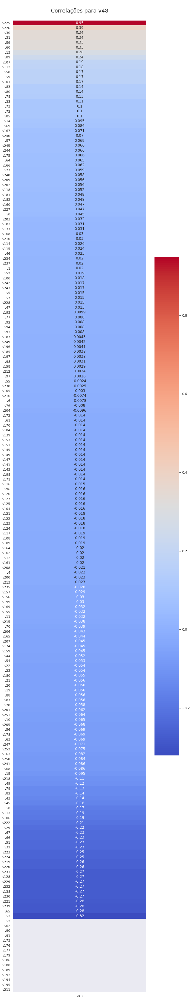

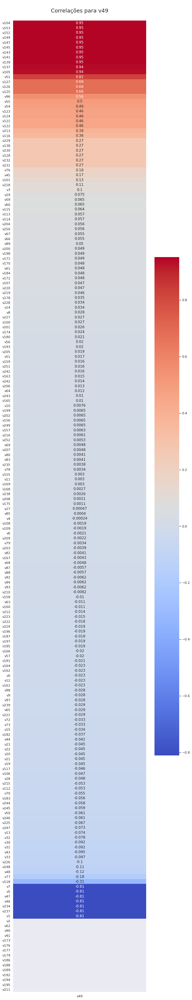

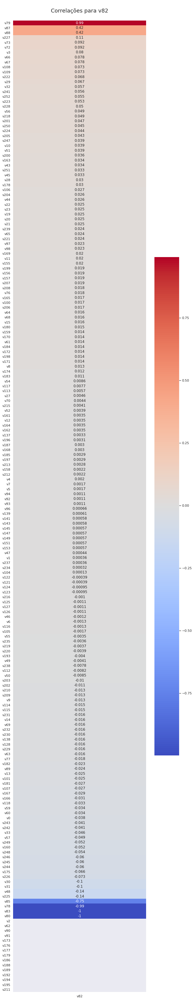

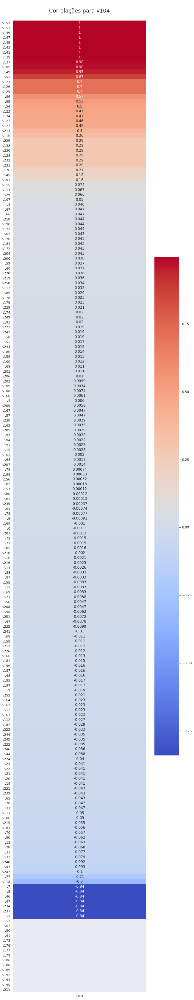

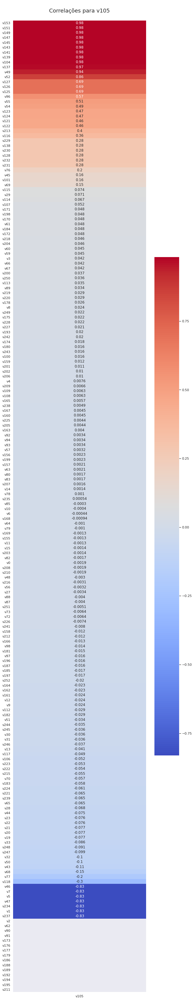

In [ ]:
for col in cid_columns:
  corr_to_target(full2,col,title = 'Correlações para '+ col, file='/content/drive/MyDrive/zica/correlacaopr'+col+'.png')

###Criando uma matriz com um string correspondente ao match de correlação e p-valor.

In [ ]:
def classecat(num):
  if abs(num) >= 0.7:
    return 'Correlação Forte'
  elif 0.5 <= abs(num) < 0.7:
    return 'Correlação Moderada'
  elif 0.3 <= abs(num) < 0.5:
    return 'Correlação Fraca'
  else:
    return 'Não há Correlação'

In [ ]:
def classepval(num):
  if abs(num) < 0.001:
    return 'Certeza Alta'
  elif 0.01 <= abs(num) < 0.05:
    return 'Certeza Moderada'
  elif 0.05 <= abs(num) < 0.1:
    return 'Certeza Fraca'
  else:
    return 'Nível de Certeza Ináceitável'

In [ ]:
relacoes = correlacao.copy()
for i in range(len(relacoes)):
  for col in relacoes[i]:
    (relacoes[i])[col] = (relacoes[i])[col].map(classecat)+ ' e '+ (p_valor[i])[col].map(classepval)

In [ ]:
relacoes[0]

,v0,v1,v2,v3,v4,v5,v6,v7,v8,v9,v10,v11,v12,v13,v14,v15,v19,v20,v21,v22,v23,v27,v28,v29,v30,v31,v32,v33,v43,v44,v45,v46,v47,v48,v49,v50,v51,v52,v54,v55,v56,v57,v59,v60,v61,v62,v63,v64,v65,v66,v67,v68,v69,v70,v72,v73,v76,v77,v78,v79,v80,v82,v83,v85,v87,v88,v89,v90,v91,v92,v93,v94,v96,v97,v98,v100,v101,v104,v105,v106,v107,v108,v109,v112,v113,v114,v115,v116,v117,v118,v121,v122,v123,v124,v125,v126,v127,v128,v137,v138,v139,v141,v143,v145,v147,v149,v151,v153,v155,v156,v157,v158,v159,v160,v161,v162,v163,v164,v165,v166,v167,v168,v169,v170,v171,v172,v173,v174,v175,v176,v177,v178,v179,v180,v181,v182,v183,v184,v185,v186,v187,v188,v189,v192,v193,v194,v195,v196,v197,v198,v199,v200,v201,v202,v203,v204,v205,v206,v207,v208,v209,v210,v211,v212,v213,v215,v216,v218,v219,v220,v221,v222,v223,v224,v225,v226,v227,v228,v229,v230,v231,v232,v234,v235,v237,v238,v239,v241,v242,v243,v244,v245,v246,v247,v248,v249,v250,v251,v252
v0,Correlação Forte e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Fraca,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Correlação Forte e Certeza Alta,Correlação Forte e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Certeza Fraca,Não há Correlação e Certeza Alta,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Correlação Fraca e Certeza Alta,Correlação Forte e Certeza Alta,Não há 

In [ ]:
relacoes[1]

,v0,v1,v2,v3,v4,v5,v6,v7,v8,v9,v10,v11,v12,v13,v14,v15,v19,v20,v21,v22,v23,v27,v28,v29,v30,v31,v32,v33,v43,v44,v45,v46,v47,v48,v49,v50,v51,v52,v54,v55,v56,v57,v59,v60,v61,v62,v63,v64,v65,v66,v67,v68,v69,v70,v72,v73,v76,v77,v78,v79,v80,v82,v83,v85,v87,v88,v89,v90,v91,v92,v93,v94,v96,v97,v98,v100,v101,v104,v105,v106,v107,v108,v109,v112,v113,v114,v115,v116,v117,v118,v121,v122,v123,v124,v125,v126,v127,v128,v137,v138,v139,v141,v143,v145,v147,v149,v151,v153,v155,v156,v157,v158,v159,v160,v161,v162,v163,v164,v165,v166,v167,v168,v169,v170,v171,v172,v173,v174,v175,v176,v177,v178,v179,v180,v181,v182,v183,v184,v185,v186,v187,v188,v189,v192,v193,v194,v195,v196,v197,v198,v199,v200,v201,v202,v203,v204,v205,v206,v207,v208,v209,v210,v211,v212,v213,v215,v216,v218,v219,v220,v221,v222,v223,v224,v225,v226,v227,v228,v229,v230,v231,v232,v234,v235,v237,v238,v239,v241,v242,v243,v244,v245,v246,v247,v248,v249,v250,v251,v252
v0,Correlação Forte e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Correlação Forte e Certeza Alta,Correlação Forte e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Correlação Fraca e Certez

###Salvando a matriz de correlações em pickle.

In [ ]:
with open('relacoes.pkl','wb') as f:
  pickle.dump(relacoes,f,pickle.HIGHEST_PROTOCOL)

In [ ]:
from google.colab import files
files.download('relacoes.pkl')

###Fazendo o scatterplot das variáveis de CID10 com as demais variáveis do banco para análise gráfica de correlação.

In [ ]:
z=sorted(np.unique(['v225','v151','v147','v143','v139','v137','v125','v7','v46','v237','v79','v78','v83','v153','v149','v145','v141','v105','v49','v127','v125','v5','v46','v47','v237','v153','v149','v145','v141','v104','v49','v127','v125','v46','v47','v1','v5']))

In [ ]:
x_vars = z
y_vars=cid_columns

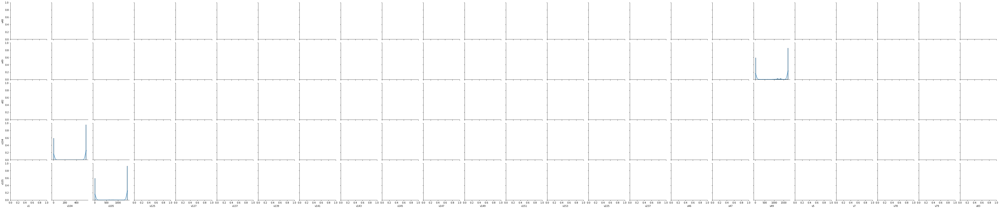

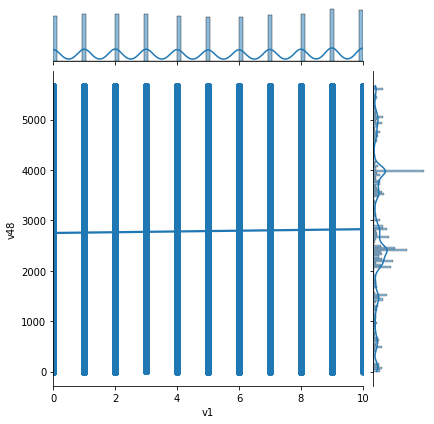

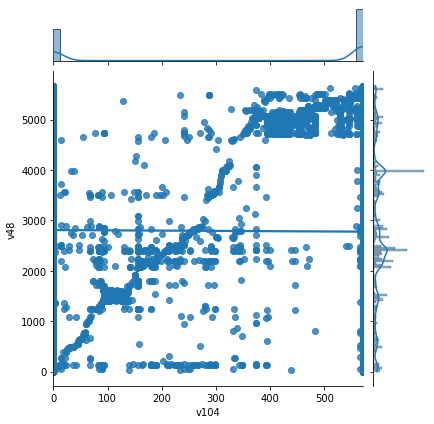

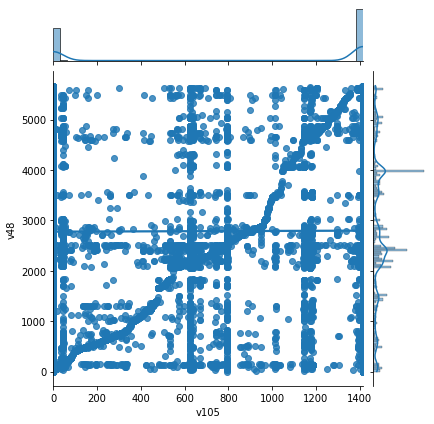

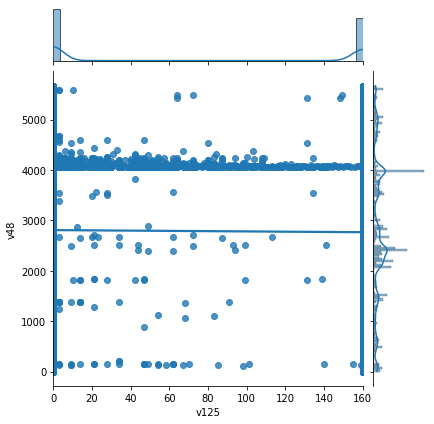

...

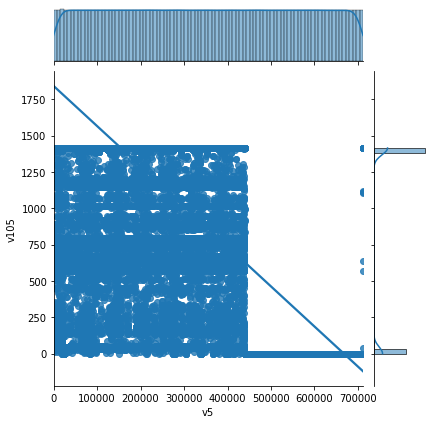

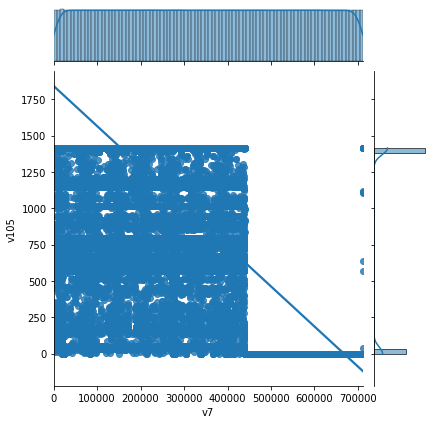

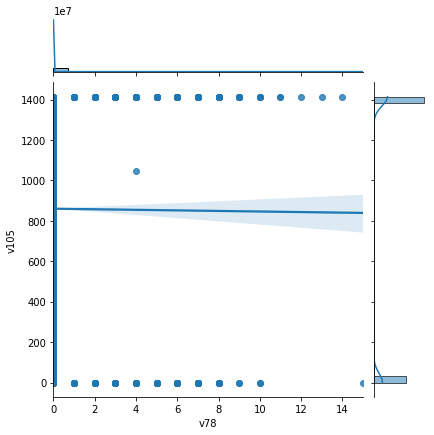

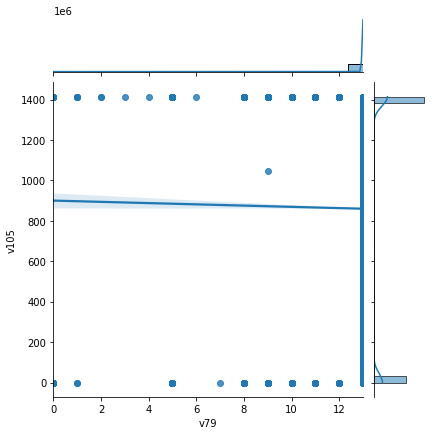

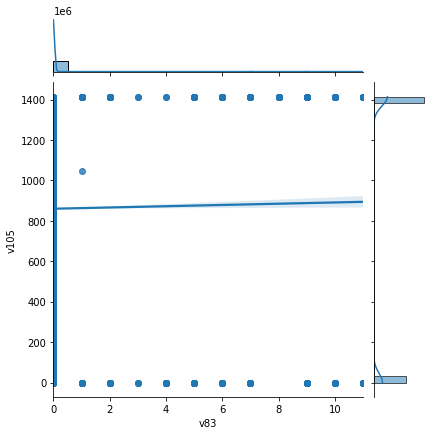

In [ ]:
plt.ioff()
g = sns.PairGrid(full2,x_vars = x_vars, y_vars=y_vars, palette='rocket')
g.map_diag(sns.histplot, kde=True)
g.map_offdiag(sns.jointplot, kind='reg')
#plt.savefig('/content/drive/MyDrive/zica/pairplotpr01'+x_vars+y_vars+'.png',format = 'png',dpi=600)
plt.show();

###Fazendo o Q-Q Plot das Variáveis do Banco.



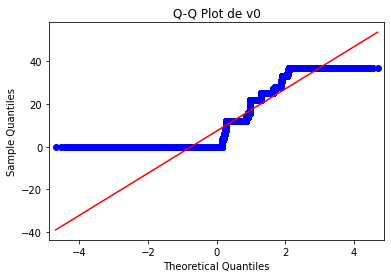

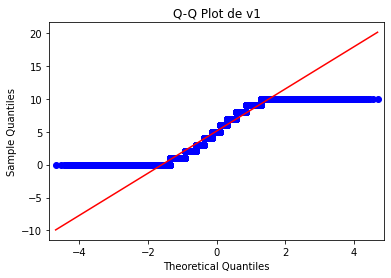

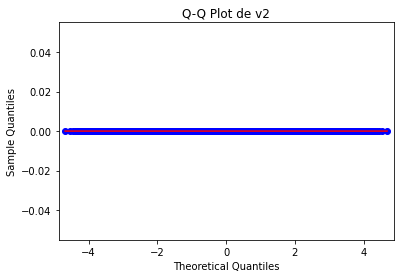

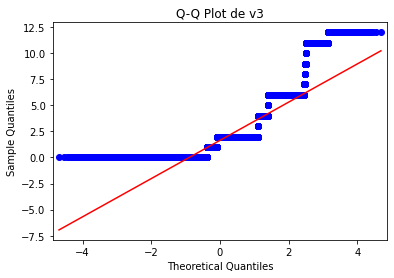

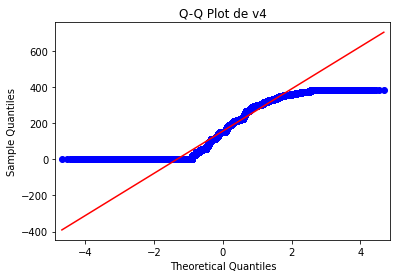

...

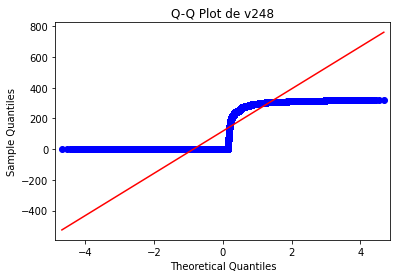

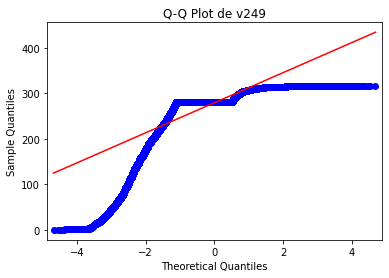

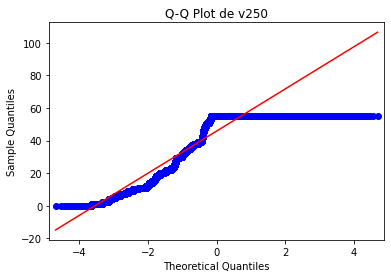

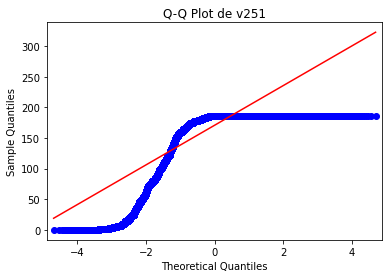

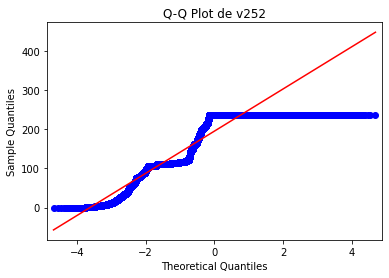

In [ ]:
plt.ioff()
for col in full2.columns:
  sm.qqplot(full2[col], line='s')
  plt.title('Q-Q Plot de ' + col)
  #plt.savefig('/content/drive/MyDrive/zica/qqplotgo'+ col +'.png',format='png',dpi=600)
  plt.show();

###Fazendo o Box Plot das Variáveis.

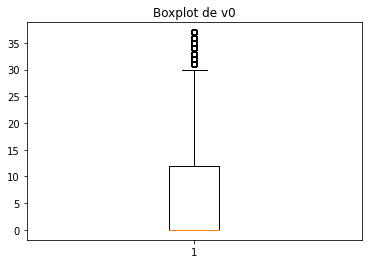

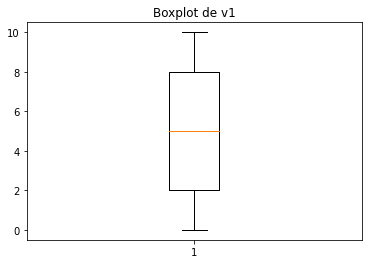

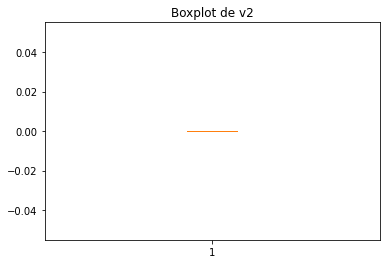

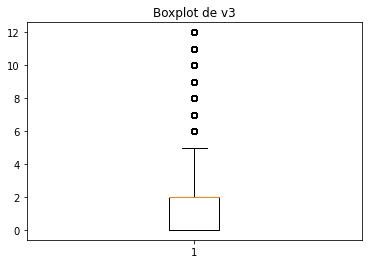

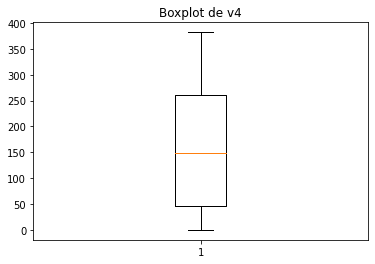

...

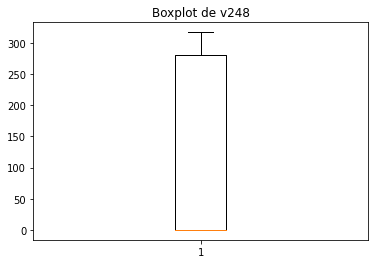

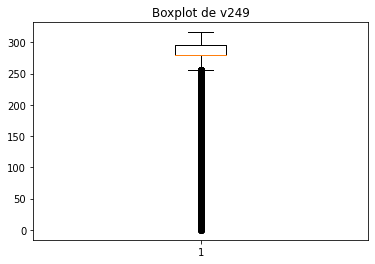

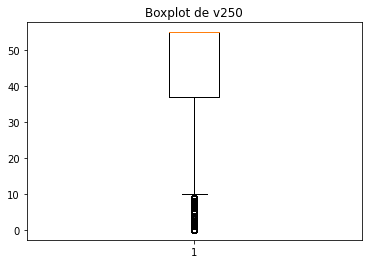

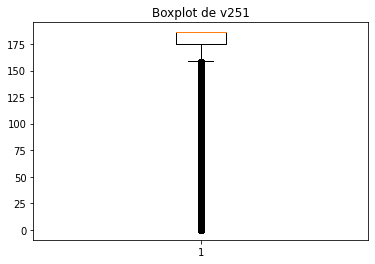

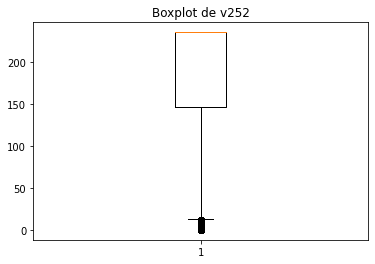

In [ ]:
plt.ioff()
for col in full2.columns:
  plt.boxplot(full2[col])
  plt.title('Boxplot de ' + col)
  #plt.savefig('/content/drive/MyDrive/zica/qqplotgo'+ col +'.png',format='png',dpi=600)
  plt.show();